# Plot figures for paper2

2025.3.4

Mu-Ting Chien

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom
import os 
import cmaps
import sys
sys.path.append('/barnes-engr-scratch1/mchien/Function/')
import atmosphere_general as ATM
import cartopy.util as cartopy_util
import cartopy.crs as ccrs
import xarray as xr

In [2]:
DIR                    = '/barnes-engr-scratch1/c832572266/'
file_dir_obs_ace2      = DIR + 'data_output/ace2/obs_compare_with_ace2/'
file_dir_ace2          = DIR + 'data_output/ace2/ace2_output/10yr/'
file_dir_ace2_100yr    = DIR + 'data_output/ace2/ace2_output/repeat_2001-2010/'
expname_list           = list(['ace2','era5'])
fig_dir                = DIR + 'figure/paper2_fig/'
os.makedirs(fig_dir, exist_ok=True)
fig_dir_supplement = fig_dir + 'supplement/'
os.makedirs(fig_dir_supplement, exist_ok=True)
sub_dir = list(['2001','2002','2003','2004','2005','2006','2007','2008','2009','2010'])
nsub    = np.size(sub_dir)

In [26]:
fig_dir_seminar                = DIR + 'figure/paper2_fig/ntu_seminar/'
os.makedirs(fig_dir_seminar, exist_ok=True)

# Figure 1: KW spectrum and map of KW activity

In [3]:
# Load KW spectrum
# Load power spectrum saved from Tropical_wave.py

# Load 10-yr observation
file_dir_multi_yr = DIR + 'data_output/ace2/obs_compare_with_ace2/'
data              = np.load(file_dir_multi_yr+'pr_wavenum_freq_10yr_imerg_2001-2010.npz')#, power_pr_sym=power_pr_sym, \
power_pr_sym_obs  = data['power_pr_sym']
power_pr_asy_obs  = data['power_pr_asy']
r_sym_obs         = data['r_sym']
r_asy_obs         = data['r_asy']
power_bg_obs      = data['power_background']
x_spec                 = data['x']
y_spec                 = data['y']
#freq=freq, zonalwnum=zonalwnum

'''
# 10-yr ACE2 simulation
file_dir_multi_yr = DIR + 'data_output/ace2/ace2_output/10yr/'
data             = np.load(file_dir_multi_yr+'pr_wavenum_freq_10yr_1mem.npz')
power_pr_sym_ace2 = data['power_pr_sym']
power_pr_asy_ace2 = data['power_pr_asy']
r_sym_ace2        = data['r_sym']
r_asy_ace2        = data['r_asy']
power_bg_ace2     = data['power_background']
'''

n0 = np.size(x_spec, 0)
n1 = np.size(x_spec, 1)

# 100-yr ACE2 simulation
power_pr_sym_ace2_100yr = np.empty([n0, n1, nsub])
power_pr_asy_ace2_100yr = np.empty([n0, n1, nsub])
r_sym_ace2_100yr        = np.empty([n0, n1, nsub])
r_asy_ace2_100yr        = np.empty([n0, n1, nsub])
power_bg_ace2_100yr     = np.empty([n0, n1, nsub]) 
for isub in range(0, nsub):
    file_dir_multi_yr                 = DIR + 'data_output/ace2/ace2_output/repeat_2001-2010/'+sub_dir[isub]+'/'
    data                              = np.load(file_dir_multi_yr+'pr_wavenum_freq_10yr_'+sub_dir[isub]+'.npz')
    power_pr_sym_ace2_100yr[:,:,isub] = data['power_pr_sym']
    r_sym_ace2_100yr[:,:,isub]        = data['r_sym']
    r_asy_ace2_100yr[:,:,isub]        = data['r_asy']
    power_pr_asy_ace2_100yr[:,:,isub] = data['power_pr_asy']
    power_bg_ace2_100yr[:,:,isub]     = data['power_background']

# calculate mean of 100-year
power_pr_sym_ace2 = np.nanmean(power_pr_sym_ace2_100yr, 2) 
power_pr_asy_ace2 = np.nanmean(power_pr_asy_ace2_100yr, 2)
r_sym_ace2        = np.nanmean(r_sym_ace2_100yr, 2)
r_asy_ace2        = np.nanmean(r_asy_ace2_100yr, 2)
power_bg_ace2     = np.nanmean(power_bg_ace2_100yr, 2)

/tmp/ipykernel_272282/2059170498.py:39: ComplexWarning: Casting complex values to real discards the imaginary part
  power_pr_sym_ace2_100yr[:,:,isub] = data['power_pr_sym']
/tmp/ipykernel_272282/2059170498.py:40: ComplexWarning: Casting complex values to real discards the imaginary part
  r_sym_ace2_100yr[:,:,isub]        = data['r_sym']
/tmp/ipykernel_272282/2059170498.py:41: ComplexWarning: Casting complex values to real discards the imaginary part
  r_asy_ace2_100yr[:,:,isub]        = data['r_asy']
/tmp/ipykernel_272282/2059170498.py:42: ComplexWarning: Casting complex values to real discards the imaginary part
  power_pr_asy_ace2_100yr[:,:,isub] = data['power_pr_asy']
/tmp/ipykernel_272282/2059170498.py:43: ComplexWarning: Casting complex values to real discards the imaginary part
  power_bg_ace2_100yr[:,:,isub]     = data['power_background']


In [5]:
# Load KW activity map (ace2-100yr)

save_data = 0 #1 or 0
if save_data == 1:
    for isub in range(0, nsub):

        file_dir_sub = file_dir_ace2_100yr + sub_dir[isub]+'/'
        data = np.load(file_dir_sub+'pr_kwfilt_ace2.npz')
        if isub == 0:
            time_filt_ace2 = data['time_filt']    
            lat_15SN_ace2 = data['lat_15SN']
            lon_ace2 = data['lon']
            nt_ace2 = np.size(time_filt_ace2)
            nlat_ace2 = np.size(lat_15SN_ace2)
            nlon_ace2 = np.size(lon_ace2)
            pr_kwfilt_ace2 = np.empty([nt_ace2, nlat_ace2, nlon_ace2, nsub])
        pr_kwfilt_ace2[:,:,:,isub] = data['pr_kwfilt']
    pr_kwstd_ace2  = np.nanmean(np.std(pr_kwfilt_ace2[:,:,:,:], 0),2)

    np.savez(file_dir_ace2_100yr+'pr_kwstd_ace2_2001-2010_100yr.npz', pr_kwstd_ace2=pr_kwstd_ace2, lat=lat_15SN_ace2, lon=lon_ace2)

else:
    data = np.load(file_dir_ace2_100yr+'pr_kwstd_ace2_2001-2010_100yr.npz')
    pr_kwstd_ace2 = data['pr_kwstd_ace2']

In [6]:
# Load KW activity map (obs)
save_data = 0 #1 or 0
if save_data == 1:
    data = np.load(file_dir_obs_ace2+'pr_kwfilt_imerg_2001-2010.npz')
    pr_kwfilt_obs = data['pr_kwfilt']
    time_filt_obs = data['time_filt']
    pr_kwstd_obs = np.std(pr_kwfilt_obs[:,:,:], 0)
    lat_15SN_obs = data['lat_15SN']
    lon_obs = data['lon']
    np.savez(file_dir_obs_ace2+'pr_kwstd_imerg_2001-2010.npz', pr_kwstd_obs=pr_kwstd_obs, lat=lat_15SN_obs, lon=lon_obs)
else:
    data = np.load(file_dir_obs_ace2+'pr_kwstd_imerg_2001-2010.npz')
    pr_kwstd_obs = data['pr_kwstd_obs']
    lat_15SN_obs = data['lat']
    lon_obs = data['lon']

In [21]:
# Load raw anomaly so that we can do some normalization
ds = xr.open_dataset(file_dir_obs_ace2+'pr_ano_15SN_imerg_2001-2010_2.5deg.nc')
pr_std_obs = np.std(ds['pr_ano_2p5deg'][:,:,:]).values

In [22]:
ds = xr.open_dataset('/barnes-engr-scratch1/mchien/data_output/ace2/ace2_output/10yr/pr_ano_15SN_ace2_2001-2010_2.5deg.nc')
pr_std_ace2 = np.std(ds['pr_ano_2p5deg'][:,:,:]).values

In [23]:
print(pr_std_obs, pr_std_ace2)

17.58096787039853 7.857444895085682


/home/C832572266/.conda/envs/muting-ai-models/lib/python3.12/site-packages/matplotlib/contour.py:1515: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/home/C832572266/.conda/envs/muting-ai-models/lib/python3.12/site-packages/matplotlib/contour.py:1516: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmin = z.min().astype(float)
/home/C832572266/.conda/envs/muting-ai-models/lib/python3.12/site-packages/numpy/ma/core.py:2892: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


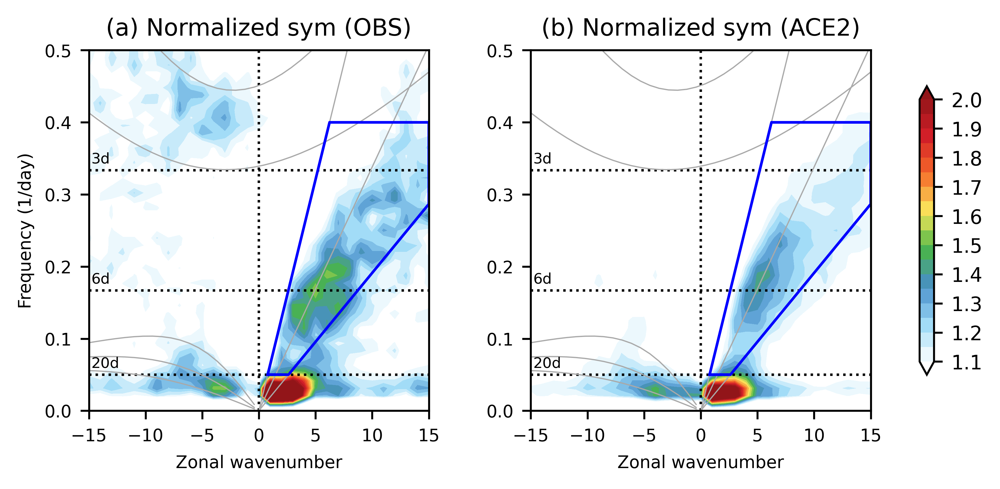

In [100]:
# Plot signal strength
d = np.array([3,6,20]) # mark 3, 6, 20 day in WK1999
dname = list(['3d','6d','20d'])
clev = np.arange(1.1, 2.05, 0.05)
cticks = np.arange(1.1, 2.1, 0.1)

sym_asy_list = list(['sym','asy'])
for sym_asy in range(0, 1):
    if sym_asy == 0:
        title = list(['(a) Normalized sym (OBS)','(b) Normalized sym (ACE2)'])
        vname = list(['r_sym_obs','r_sym_ace2'])
    else:
        title = list(['(a) Normalized asy (OBS)','(b) Normalized asy (ACE2)'])
        vname = list(['r_asy_obs','r_asy_ace2'])

    fig_name = 'Fig.1.KW_spectrum_and_map.png'
    fig, axes = plt.subplots(1,2,figsize=(6.5, 3),dpi=600)
    plt.rcParams.update({'font.size': 8})
    plt.subplots_adjust(left=0.1,right=0.95,top=0.88,bottom=0.2, wspace=0.3, hspace=0.5)
    for iplt in range(0, 2):
        plt.subplot(1, 2, iplt+1)
        ax = plt.gca()

        VAR = globals()[vname[iplt]]
        plt.contourf(x_spec,y_spec,VAR,cmap=cmaps.WhiteBlueGreenYellowRed,levels = clev,extend='both')
        if iplt == 1:
            cb = plt.colorbar(ax=axes,orientation = 'vertical',shrink=.8, aspect=20, pad=0.05)
            cb.set_ticks(cticks)
        # Mark 3, 6, 20 day period:
        for dd in range(0,np.size(d)):
            plt.plot([-15,15], [1/d[dd],1/d[dd]], 'k',linewidth=1, linestyle=':')
            plt.text(-14.8,1/d[dd]+0.01,dname[dd], fontsize=6)
        
        plt.title(title[iplt])

        # Mark zwnum == 0:
        plt.plot([0,0],[0,0.5],'k',linewidth=1,linestyle=':')#'dashed')
        plt.xlim([-15,15])
        plt.ylim([0,0.5])
        plt.xticks(np.arange(-15,20,5))
        plt.xlabel('Zonal wavenumber')
        if iplt == 0 or iplt == 3:
            plt.ylabel('Frequency (1/day)')

        swfreq,swwn = ATM.genDispersionCurves()
        # swfreq.shape # -->(6, 3, 50)
        swf = np.where(swfreq == 1e20, np.nan, swfreq)
        swk = np.where(swwn == 1e20, np.nan, swwn)
        c = 'darkgray' # COLOR FOR DISPERSION LINES/LABELS
        
        if sym_asy == 0:
            ii_st = 3
            ii_end = 6
        elif sym_asy == 1:
            ii_st = 0
            ii_end = 3
        else:
            ii_st = 0
            ii_end = 0

        for ii in range(ii_st, ii_end):
            ax.plot(swk[ii, 0,:], swf[ii,0,:], color=c, linewidth=0.5)
            ax.plot(swk[ii, 1,:], swf[ii,1,:], color=c, linewidth=0.5)
            ax.plot(swk[ii, 2,:], swf[ii,2,:], color=c, linewidth=0.5)
        #ax.axvline(0, linestyle='dashed', color='lightgray')

        # Plot band for each wave
        he = np.array([8, 25, 90])
        s2d = 86400
        re = 6371*1000
        g = 9.8

        ##################
        # CCKW band
        s_min = (g*he[0])**0.5/(2*np.pi*re)*s2d #slope of he = 8m
        s_max = (g*he[2])**0.5/(2*np.pi*re)*s2d #slope of he = 90m
        kw_tmax_list = np.array([8,7,4])
        kw_tmax = 20
        fmax = 0.4
        kw_x = np.array([1/kw_tmax/s_max, 1/kw_tmax/s_min,     15,  15, fmax/s_max, 1/kw_tmax/s_max])
        kw_y = np.array([1/kw_tmax,             1/kw_tmax,  15*s_min, fmax,      fmax,  1/kw_tmax])

        if sym_asy == 0:
            # Mark CCKW band:
            for kk in range(0,np.size(kw_x)):
                plt.plot(kw_x,kw_y,'b',linewidth=1,linestyle='solid')
        
    plt.savefig(fig_dir + fig_name,format='png', dpi=600)
    plt.show()

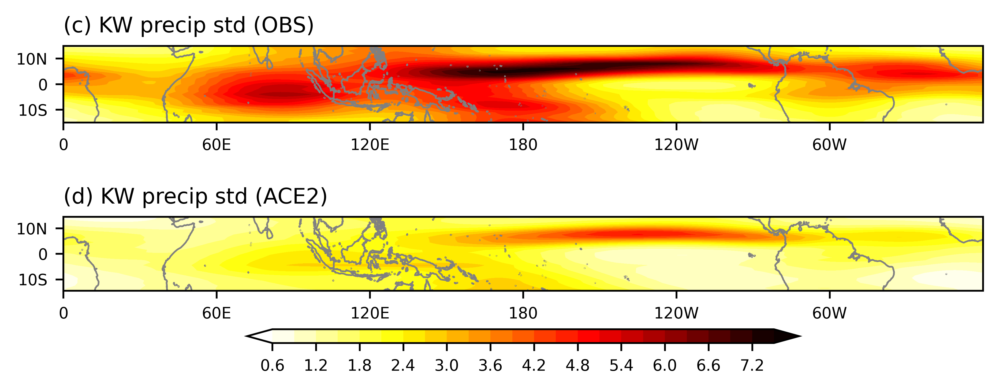

In [115]:
# Plot KW map
clev = np.arange(0.6,7.8,0.3)
ticks = np.arange(0.6,7.8,0.6)         
vname_list = list(['obs','ace2'])
fig_label = list(['(c)','(d)'])
vname_list_title = list(['OBS','ACE2'])

fig_name = 'Fig.1_kw-precip_std.png'       
            
fig, axes = plt.subplots(2,1,figsize=(6.5, 3.2),dpi=600, subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)} )
plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.2, wspace=0.1)
plt.rcParams.update({'font.size': 8})

for iplt in range(0,2):
    plt.subplot(2,1, iplt+1)
    ax = plt.gca()

    V_tmp = globals()['pr_kwstd_'+vname_list[iplt]]
    lon_tmp = globals()['lon_'+vname_list[iplt]]
    lat_tmp = globals()['lat_15SN_'+vname_list[iplt]]

    #print(lon_tmp)
    [xx, yy] = np.meshgrid(lon_tmp, lat_tmp)        
    
    # Handle the data to prevent white line
    [V_tmp_cyclic, lon_cyclic] = cartopy_util.add_cyclic_point(
        V_tmp.T, 
        coord=lon_tmp,
        axis=0
    )

    ax.coastlines(color='grey', linewidth=0.75)
    #ax.set_xticks(np.arange(-180,240,60), crs=ccrs.PlateCarree())
    ax.set_xticks(np.arange(0,360,60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-10,20,10), crs=ccrs.PlateCarree())
    ax.set_xticklabels(['0', '60E', '120E', '180', '120W', '60W'])
    ax.set_yticklabels(['10S', '0', '10N'])

    # Plot the data
    contour = plt.contourf(
        lon_cyclic, lat_tmp, V_tmp_cyclic.T, cmap='hot_r',
        transform=ccrs.PlateCarree(), levels= clev, extend='both'
    )

    plt.title(fig_label[iplt]+' KW precip std ('+vname_list_title[iplt]+')', loc='left')  

cb = fig.colorbar(contour, ax=axes, orientation='horizontal',shrink=0.6, fraction=0.1, pad=0.1, aspect=40)           
cb.ax.tick_params(labelsize=7)
cb.set_ticks(ticks)    
plt.savefig(fig_dir+fig_name,format='png', dpi=600)
plt.show() 
plt.close()

# KW map (normalize): only use for NTU seminar, not for paper

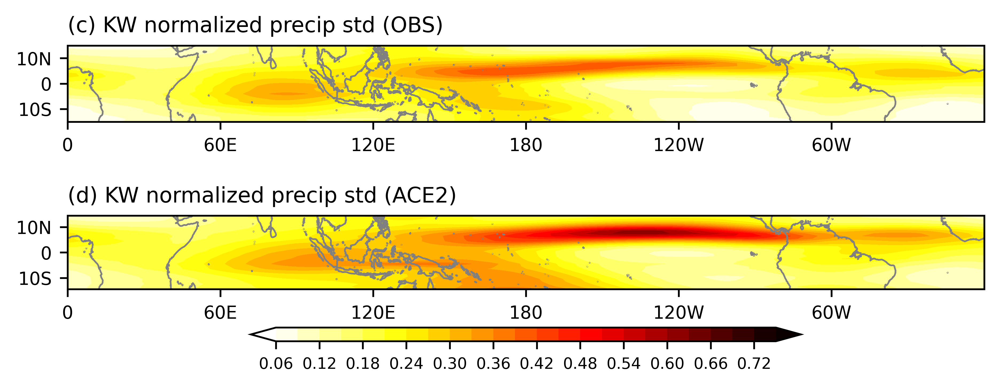

In [27]:
# Plot KW map
clev = np.arange(0.6,7.8,0.3)/10
ticks = np.arange(0.6,7.8,0.6)/10         
vname_list = list(['obs','ace2'])
fig_label = list(['(c)','(d)'])
vname_list_title = list(['OBS','ACE2'])

fig_name = 'Fig.1_kw-precip_std_normalize.png'       
            
fig, axes = plt.subplots(2,1,figsize=(6.5, 3.2),dpi=600, subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)} )
plt.subplots_adjust(left=0.1, right=0.98,top=0.9,bottom=0.15,hspace=0.2, wspace=0.1)
plt.rcParams.update({'font.size': 8})

for iplt in range(0,2):
    plt.subplot(2,1, iplt+1)
    ax = plt.gca()

    V_tmp = globals()['pr_kwstd_'+vname_list[iplt]]
    lon_tmp = globals()['lon_'+vname_list[iplt]]
    lat_tmp = globals()['lat_15SN_'+vname_list[iplt]]
    V_std = globals()['pr_std_'+vname_list[iplt]]

    #print(lon_tmp)
    [xx, yy] = np.meshgrid(lon_tmp, lat_tmp)        
    
    # Handle the data to prevent white line
    [V_tmp_cyclic, lon_cyclic] = cartopy_util.add_cyclic_point(
        V_tmp.T/V_std, 
        coord=lon_tmp,
        axis=0
    )

    ax.coastlines(color='grey', linewidth=0.75)
    #ax.set_xticks(np.arange(-180,240,60), crs=ccrs.PlateCarree())
    ax.set_xticks(np.arange(0,360,60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-10,20,10), crs=ccrs.PlateCarree())
    ax.set_xticklabels(['0', '60E', '120E', '180', '120W', '60W'])
    ax.set_yticklabels(['10S', '0', '10N'])

    # Plot the data
    contour = plt.contourf(
        lon_cyclic, lat_tmp, V_tmp_cyclic.T, cmap='hot_r',
        transform=ccrs.PlateCarree(), levels= clev, extend='both'
    )

    plt.title(fig_label[iplt]+' KW normalized precip std ('+vname_list_title[iplt]+')', loc='left')  

cb = fig.colorbar(contour, ax=axes, orientation='horizontal',shrink=0.6, fraction=0.1, pad=0.1, aspect=40)           
cb.ax.tick_params(labelsize=7)
cb.set_ticks(ticks)    
plt.savefig(fig_dir_seminar+fig_name,format='png', dpi=600)
plt.show() 
plt.close()

# Combine the two figures (I didn't use the below code because i just use powerpoint to do so)

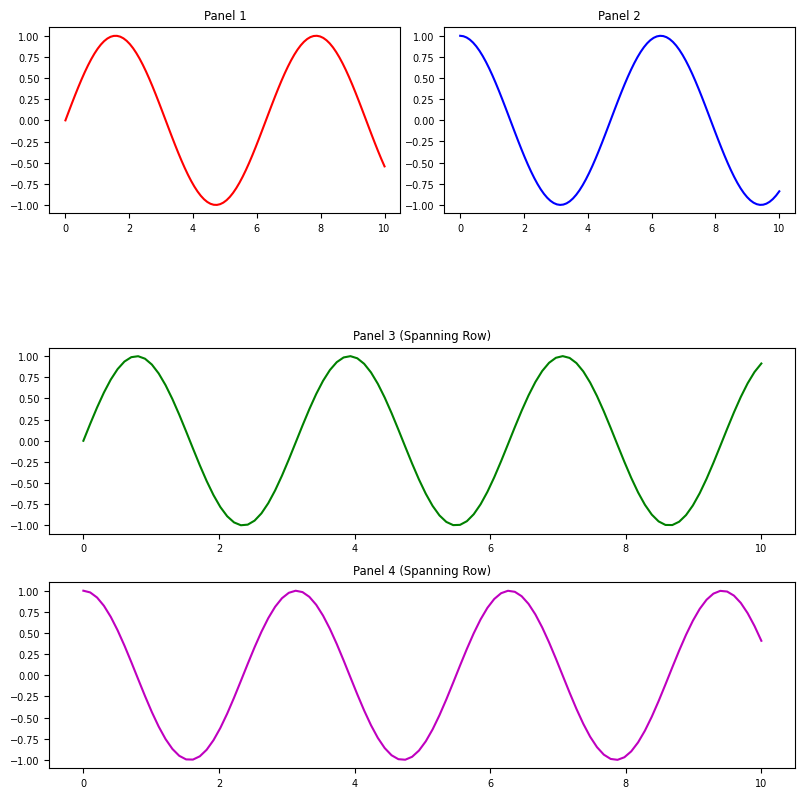

In [111]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Create figure
fig = plt.figure(figsize=(8, 8), dpi=100)

# Define GridSpec layout (4 rows, 2 columns)
gs = gridspec.GridSpec(4, 2, height_ratios=[1, 0.1, 0.2, 0.2])  # Adjust row heights

# First row: Two side-by-side subplots
ax1 = fig.add_subplot(gs[0, 0])  # First subplot (row 1, col 1)
ax2 = fig.add_subplot(gs[0, 1])  # Second subplot (row 1, col 2)

# Second row is skipped (height ratio = 0.2, just a small gap)

# Third row: One large panel spanning both columns
ax3 = fig.add_subplot(gs[2, :])  # Third subplot (row 3, spans all columns)

# Fourth row: Another large panel spanning both columns
ax4 = fig.add_subplot(gs[3, :])  # Fourth subplot (row 4, spans all columns)

# Sample data
x = np.linspace(0, 10, 100)
y = np.sin(x)

# Plot data
ax1.plot(x, y, 'r-'); ax1.set_title("Panel 1")
ax2.plot(x, np.cos(x), 'b-'); ax2.set_title("Panel 2")
ax3.plot(x, np.sin(2*x), 'g-'); ax3.set_title("Panel 3 (Spanning Row)")
ax4.plot(x, np.cos(2*x), 'm-'); ax4.set_title("Panel 4 (Spanning Row)")

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

# Fig. S1: Raw and Background spectrum

/tmp/ipykernel_2007010/2891255425.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(x_spec,y_spec,np.log10(VAR),cmap=get_cmap('hot_r'),levels = clev,extend='both')
/home/C832572266/.conda/envs/muting-ai-models/lib/python3.12/site-packages/matplotlib/contour.py:1515: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/home/C832572266/.conda/envs/muting-ai-models/lib/python3.12/site-packages/matplotlib/contour.py:1516: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmin = z.min().astype(float)
/home/C832572266/.conda/envs/muting-ai-models/lib/python3.12/site-packages/numpy/ma/core.py:2892: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, cop

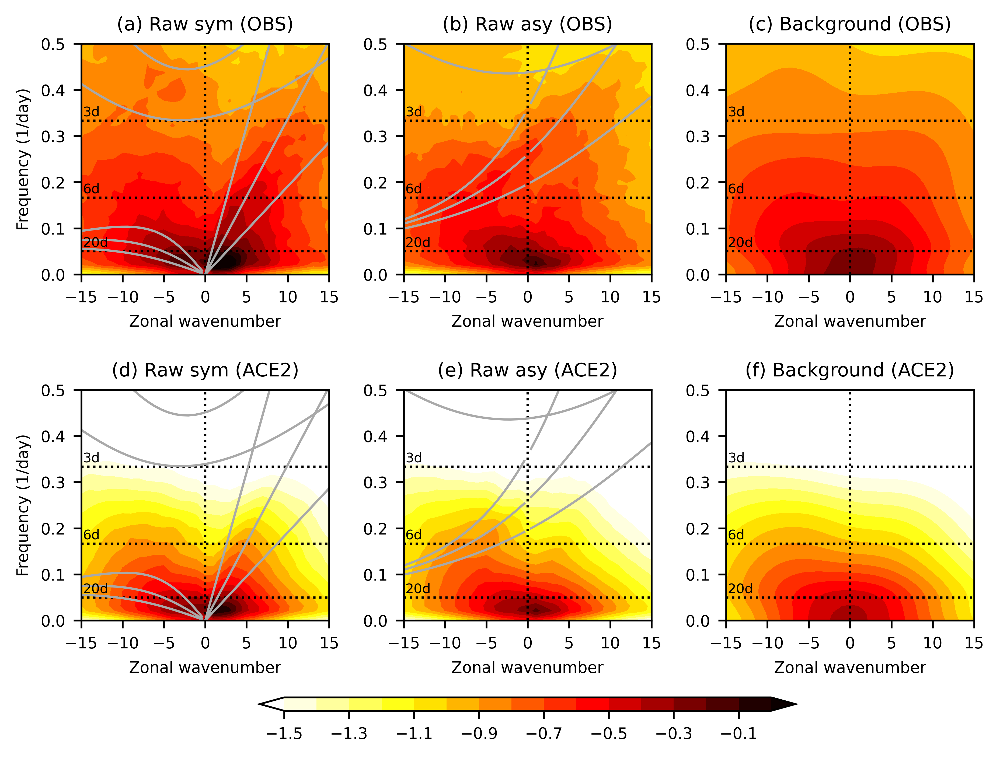

In [122]:
############################
# Plotting raw and background spectrum
#############################
from matplotlib.cm import get_cmap
clev = np.arange(-1.5,0.1,0.1)
cticks = np.arange(-1.5, 0.1, 0.2)
d = np.array([3,6,20]) # mark 3, 6, 20 day in WK1999
dname = list(['3d','6d','20d'])
vname = list(['power_pr_sym_obs','power_pr_asy_obs','power_bg_obs',\
              'power_pr_sym_ace2','power_pr_asy_ace2','power_bg_ace2'])
title = list(['(a) Raw sym (OBS)','(b) Raw asy (OBS)','(c) Background (OBS)',\
              '(d) Raw sym (ACE2)','(e) Raw asy (ACE2)','(f) Background (ACE2)'])

fig_name = 'Fig.S1.raw_power_spectrum.png'
fig, axes = plt.subplots(2,3,figsize=(6.5, 7),dpi=600)
plt.rcParams.update({'font.size': 7})
plt.subplots_adjust(left=0.1,right=0.95,top=0.88,bottom=0.2, wspace=0.3, hspace=0.5)
for iplt in range(0, 6):
    plt.subplot(2, 3, iplt+1)
    ax = plt.gca()
    if iplt == 0 or iplt == 3:
        sym_asy = 0 # plot symmetric spectrum
    elif iplt == 1 or iplt == 4:
        sym_asy = 1 # plot asymmetric spectrum
    elif iplt == 2  or iplt == 5:
        sym_asy = 2 # plot background spectrum

    VAR = globals()[vname[iplt]]
    plt.contourf(x_spec,y_spec,np.log10(VAR),cmap=get_cmap('hot_r'),levels = clev,extend='both')
    if iplt == 5:
        cb = plt.colorbar(ax=axes[:,:],orientation = 'horizontal',shrink=.6, aspect=40, pad=0.1)
        cb.set_ticks(cticks)
    # Mark 3, 6, 20 day period:
    for dd in range(0,np.size(d)):
        plt.plot([-15,15], [1/d[dd],1/d[dd]], 'k',linewidth=1, linestyle=':')
        plt.text(-14.8,1/d[dd]+0.01,dname[dd], fontsize=6)
    
    plt.title(title[iplt])

    # Mark zwnum == 0:
    plt.plot([0,0],[0,0.5],'k',linewidth=1,linestyle=':')#'dashed')
    plt.xlim([-15,15])
    plt.ylim([0,0.5])
    plt.xticks(np.arange(-15,20,5))
    plt.xlabel('Zonal wavenumber')
    if iplt == 0 or iplt == 3:
        plt.ylabel('Frequency (1/day)')

    swfreq,swwn = ATM.genDispersionCurves()
    # swfreq.shape # -->(6, 3, 50)
    swf = np.where(swfreq == 1e20, np.nan, swfreq)
    swk = np.where(swwn == 1e20, np.nan, swwn)
    c = 'darkgray' # COLOR FOR DISPERSION LINES/LABELS
    
    if sym_asy == 0:
        ii_st = 3
        ii_end = 6
    elif sym_asy == 1:
        ii_st = 0
        ii_end = 3
    else:
        ii_st = 0
        ii_end = 0

    for ii in range(ii_st, ii_end):
        ax.plot(swk[ii, 0,:], swf[ii,0,:], color=c, linewidth=1)
        ax.plot(swk[ii, 1,:], swf[ii,1,:], color=c, linewidth=1)
        ax.plot(swk[ii, 2,:], swf[ii,2,:], color=c, linewidth=1)
    #ax.axvline(0, linestyle='dashed', color='lightgray')
    
plt.savefig(fig_dir_supplement + fig_name,format='png', dpi=600)
plt.show()

# Figure 2: Lag day between KW and TC genesis

In [6]:
# Load lag day data for ACE2 (100yr)
data = np.load(file_dir_ace2_100yr+'TC_genesis_30SN/TCgenesis_lag_kwcrest_hr_10SN_basin_summer_only_100yr.npz')
dhr_ace2_basin0_100yr = data['dhr_ace2_basin0_100yr']
dhr_ace2_basin1_100yr = data['dhr_ace2_basin1_100yr']
dhr_ace2_basin2_100yr = data['dhr_ace2_basin2_100yr']
dhr_ace2_basin3_100yr = data['dhr_ace2_basin3_100yr']
dhr_ace2_basin4_100yr = data['dhr_ace2_basin4_100yr']
dhr_ace2_basin5_100yr = data['dhr_ace2_basin5_100yr']
basin_list = data['basin_list']
nbasin     = np.size(basin_list)

# Load lag day data for obs
data            = np.load(file_dir_obs_ace2+'TCgenesis_lag_kwcrest_hr_10SN_'+expname_list[1]+'_basin_summer_only.npz')
dhr_era5_basin0 = data['dhr_basin0']
dhr_era5_basin1 = data['dhr_basin1']
dhr_era5_basin2 = data['dhr_basin2']
dhr_era5_basin3 = data['dhr_basin3']
dhr_era5_basin4 = data['dhr_basin4']
dhr_era5_basin5 = data['dhr_basin5']

# Load significance level for ACE2 (100yr)
data = np.load(file_dir_ace2_100yr+'TC_genesis_30SN/TCgenesis_lag_kwcrest_99.9_significance_level_100yr.npz')
x_99_ace2_basin = data['x_99_ace2_daily_basin']

# Load significance level for obs (10yr)
data = np.load(file_dir_obs_ace2+'TCgenesis_lag_kwcrest_99.9_significance_level.npz')
x_99_obs_basin = data['x_99_obs_daily_basin']

# Plot Fig.2 histogram (start here!!!)

In [ ]:
# Plot histogram! start here!

hr_bin_daily = np.arange(-8.5, 9.5, 1)

for bin_daily in range(1,2):
    fig_name = 'Fig.2.KW_TCgenesis_laghr_histogram_daily_each_basin_summer_only.png'
    fig = plt.subplots(2,3,figsize=(6.5, 4),dpi=600)
    plt.subplots_adjust(left=0.2,right=0.99,top=0.88,bottom=0.2, hspace=0.8, wspace=0.2)
    plt.rcParams.update({'font.size': 6})
    zero = np.array([0,0])
    for ibasin in range(0, nbasin):
        plt.subplot(2, 3, ibasin+1)
        dhr_tmp = globals()['dhr_ace2_basin'+str(ibasin)+'_100yr']
        #
        plt.hist(dhr_tmp/24, hr_bin_daily, color='b',histtype='step')
        #plt.hist(dhr_obs_10SN/24, hr_bin_daily, color='k',histtype='step')
        plt.plot([-8,8], [x_99_ace2_basin[ibasin], x_99_ace2_basin[ibasin]], color='dodgerblue', linewidth=0.5, linestyle='dashed')
        #plt.plot([-8,8], [x_99_obs, x_99_obs], color='grey', linewidth=0.5, linestyle='dashed')
        plt.xlabel('Days after KW active phase')
        plt.xticks(np.arange(-8,9,1), fontsize=5)
        #plt.xticks(np.arange(-5,6,1), fontsize=5.5)
        plt.plot(zero, [0,150], color='grey',linestyle=':')
        #
        if ibasin == 0:
            plt.legend(['ACE2-ERA5'])#,'OBS'])
        if ibasin == 0 or ibasin == 3:
            plt.ylabel('TC genesis number')
        plt.title(basin_list[ibasin])
    plt.suptitle('                                            TC genesis lags KWs (KW phase from 10S-10N averge)')
    plt.savefig(fig_dir+fig_name,format='png', dpi=600)
    plt.show()
    plt.close()

# Figure 3: TCGI lag KW peak + horizontal and vertical structure of KW

In [4]:
# Load TCGI lag regression from ACE2 (100yr)
data = np.load(file_dir_ace2_100yr+'TCGI_KW_lag_regression_basin_ace2_100yr.npz')
TCGI_lag_kw_basin_ace2         = data['TCGI_lag_kw_basin_ace2']
shear_lag_kw_basin_ace2        = data['shear_lag_kw_basin_ace2']
col_rh_lag_kw_basin_ace2       = data['col_rh_lag_kw_basin_ace2']
abs_vor_clip_lag_kw_basin_ace2 = data['abs_vor_clip_lag_kw_basin_ace2']
#abs_vor_lag_kw_basin_ace2=abs_vor_lag_kw_basin_ace2,\
relsst_lag_kw_basin_ace2 = data['relsst_lag_kw_basin_ace2']
lags                     = data['lags']
basin_list               = data['basin_list']

# Load TCGI lag regression from OBS (10yr)
data = np.load(file_dir_obs_ace2+'TCGI_KW_lag_regression_basin_era5.npz')
TCGI_lag_kw_basin_era5         = data['TCGI_lag_kw_basin_era5']
shear_lag_kw_basin_era5        = data['shear_lag_kw_basin_era5']
col_rh_lag_kw_basin_era5       = data['col_rh_lag_kw_basin_era5']
abs_vor_clip_lag_kw_basin_era5 = data['abs_vor_clip_lag_kw_basin_era5']
#abs_vor_lag_kw_basin_era5=abs_vor_lag_kw_basin_era5,\
relsst_lag_kw_basin_era5 = data['relsst_lag_kw_basin_era5']

In [7]:
# Calculate daily average of KW composite TCGI
vname_list = list(['TCGI','shear','col_rh','abs_vor_clip','relsst'])
unit_list = list(['#/yr','m/s','%','1/s','K'])
#
lag = 32
lags = np.arange(-lag, lag+1)/4
calc_daily = 1
if calc_daily == 1:
    lags_daily = np.arange(-lag/4+1, lag/4)
unit_list = list(['#/yr','m/s','%','1/s','1/s','K'])
daily = list(['','_daily'])
lag_day = int(lag/4)

for iv in range(0, np.size(vname_list)):

    KW_composite_ace2 = globals()[vname_list[iv]+'_lag_kw_basin_ace2']
    KW_composite_era5 = globals()[vname_list[iv]+'_lag_kw_basin_era5']

    if calc_daily == 1:
        # Calculate daily average
        for it in range(0, lag_day*2-1):
            if it == 0 and iv == 0:
                KW_composite_ace2_TCGI_daily = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_TCGI_daily = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_shear_daily = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_shear_daily = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_col_rh_daily = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_col_rh_daily = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_abs_vor_clip_daily = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_abs_vor_clip_daily = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_relsst_daily = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_relsst_daily = np.empty([lag_day*2-1, nbasin])
                #
                dcrh_ace2_daily = np.empty([])

            if iv == 0:
                KW_composite_ace2_TCGI_daily[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_TCGI_daily[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)
            elif iv == 1:
                KW_composite_ace2_shear_daily[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_shear_daily[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)
            elif iv == 2:
                KW_composite_ace2_col_rh_daily[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_col_rh_daily[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)        
            elif iv == 3:
                KW_composite_ace2_abs_vor_clip_daily[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_abs_vor_clip_daily[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)    
            elif iv == 4:
                KW_composite_ace2_relsst_daily[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_relsst_daily[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)                                          

# Test only (KW composite STD)

In [8]:
# Load std from KW composite from obs
data = np.load(file_dir_obs_ace2+'TCGI_KW_lag_regression_basin_era5_std.npz')
TCGI_lag_kw_basin_era5_std         = data['TCGI_lag_kw_basin_era5']
shear_lag_kw_basin_era5_std        = data['shear_lag_kw_basin_era5']
col_rh_lag_kw_basin_era5_std       = data['col_rh_lag_kw_basin_era5']
abs_vor_clip_lag_kw_basin_era5_std = data['abs_vor_clip_lag_kw_basin_era5']   
relsst_lag_kw_basin_era5_std = data['relsst_lag_kw_basin_era5']

# Load std from ACE2 (100YR)
data = np.load(file_dir_ace2_100yr+'TCGI_KW_lag_regression_basin_ace2_100yr_std.npz')
TCGI_lag_kw_basin_ace2_std         = data['TCGI_lag_kw_basin_ace2']
shear_lag_kw_basin_ace2_std        = data['shear_lag_kw_basin_ace2']
col_rh_lag_kw_basin_ace2_std       = data['col_rh_lag_kw_basin_ace2']
abs_vor_clip_lag_kw_basin_ace2_std = data['abs_vor_clip_lag_kw_basin_ace2']   
relsst_lag_kw_basin_ace2_std = data['relsst_lag_kw_basin_ace2']

In [9]:
# Calculate daily average of KW composite TCGI std
vname_list = list(['TCGI','shear','col_rh','abs_vor_clip','relsst'])
unit_list = list(['#/yr','m/s','%','1/s','K'])
#
lag = 32
lags = np.arange(-lag, lag+1)/4
calc_daily = 1
if calc_daily == 1:
    lags_daily = np.arange(-lag/4+1, lag/4)
unit_list = list(['#/yr','m/s','%','1/s','1/s','K'])
daily = list(['','_daily'])
lag_day = int(lag/4)

for iv in range(0, np.size(vname_list)):

    KW_composite_ace2 = globals()[vname_list[iv]+'_lag_kw_basin_ace2_std']
    KW_composite_era5 = globals()[vname_list[iv]+'_lag_kw_basin_era5_std']

    if calc_daily == 1:
        # Calculate daily average
        for it in range(0, lag_day*2-1):
            if it == 0 and iv == 0:
                KW_composite_ace2_TCGI_daily_std = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_TCGI_daily_std = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_shear_daily_std = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_shear_daily_std = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_col_rh_daily_std = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_col_rh_daily_std = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_abs_vor_clip_daily_std = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_abs_vor_clip_daily_std = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_relsst_daily_std = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_relsst_daily_std = np.empty([lag_day*2-1, nbasin])

            if iv == 0:
                KW_composite_ace2_TCGI_daily_std[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_TCGI_daily_std[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)
            elif iv == 1:
                KW_composite_ace2_shear_daily_std[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_shear_daily_std[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)
            elif iv == 2:
                KW_composite_ace2_col_rh_daily_std[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_col_rh_daily_std[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)        
            elif iv == 3:
                KW_composite_ace2_abs_vor_clip_daily_std[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_abs_vor_clip_daily_std[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)    
            elif iv == 4:
                KW_composite_ace2_relsst_daily_std[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_relsst_daily_std[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)             

# Load t-test result (testing)

In [10]:
data       = np.load(file_dir_ace2_100yr+'TCGI_KW_lag_regression_basin_ace2_100yr_ttest_95%.npz')
dcrh_ace2  = data['dcrh_ace2']
dvor_ace2  = data['dvor_ace2']
lags       = data['lags']
basin_list = data['basin_list']


data      = np.load(file_dir_obs_ace2+'TCGI_KW_lag_regression_basin_era5_10yr_ttest_95%.npz')#,\
dcrh_era5 = data['dcrh_era5']
dvor_era5 = data['dvor_era5']

In [11]:
# Calculate daily average of KW composite t-test result
vname_list2 = list(['dcrh','dvor'])

#
lag = 32
lags = np.arange(-lag, lag+1)/4
calc_daily = 1
if calc_daily == 1:
    lags_daily = np.arange(-lag/4+1, lag/4)

daily = list(['','_daily'])
lag_day = int(lag/4)

for iv in range(0, np.size(vname_list2)):

    KW_composite_ace2 = globals()[vname_list2[iv]+'_ace2']
    KW_composite_era5 = globals()[vname_list2[iv]+'_era5']

    if calc_daily == 1:
        # Calculate daily average
        for it in range(0, lag_day*2-1):
            if it == 0 and iv == 0:
                #
                KW_composite_ace2_col_rh_daily_std_ttest = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_col_rh_daily_std_ttest = np.empty([lag_day*2-1, nbasin])
                #
                KW_composite_ace2_abs_vor_clip_daily_std_ttest = np.empty([lag_day*2-1, nbasin])
                KW_composite_era5_abs_vor_clip_daily_std_ttest = np.empty([lag_day*2-1, nbasin])


            if iv == 0:
                KW_composite_ace2_col_rh_daily_std_ttest[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_col_rh_daily_std_ttest[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)        
            elif iv == 1:
                KW_composite_ace2_abs_vor_clip_daily_std_ttest[it, :] = np.nanmean(KW_composite_ace2[it*4+2:(it+1)*4+2+1, :], 0)
                KW_composite_era5_abs_vor_clip_daily_std_ttest[it, :] = np.nanmean(KW_composite_era5[it*4+2:(it+1)*4+2+1, :], 0)    

In [37]:
print(KW_composite_era5_abs_vor_clip_daily_std_ttest[:,0])
print(KW_composite_ace2_abs_vor_clip_daily_std_ttest[:,0])

[3.14957864e-08 3.60957319e-08 3.96206084e-08 4.45381007e-08
 5.24925070e-08 4.27435012e-08 2.98871915e-08 4.55712091e-08
 4.62685865e-08 4.30559197e-08 3.18809149e-08 4.79389740e-08
 5.76696443e-08 4.51187965e-08 4.16978416e-08]
[8.16441472e-09 7.11012182e-09 6.39859394e-09 5.32540870e-09
 5.49211233e-09 7.61961629e-09 9.25284700e-09 9.07976020e-09
 7.01980319e-09 5.40801877e-09 5.28913449e-09 4.70591516e-09
 4.80930868e-09 6.56598282e-09 8.03410852e-09]


# Official

In [18]:
#################################
# Load KW vertical structure
#################################
# Load 100-year ACE2 ensemble mean KW lag-regression of q
data = np.load(file_dir_ace2_100yr+'q_KW_lag_regression_plev_basin_ace2_100yr.npz')
plev = data['plev']
q_lag_kw_basin_ace2 = data['q_lag_kw_basin_ace2_100yr_mean'] # (lag, plev, basin)
basin_list = data['basin_list']
lags = data['lags'] 

# Load observed KW lag regression of q from ERA5 and IMERG
data = np.load(file_dir_obs_ace2+'q_KW_lag_regression_plev_basin_era5.npz')
ilev_list = np.array([0,1,2,3,4,5,6,7,9])
q_lag_kw_basin_era5 = data['q_lag_kw_basin_era5'][:,ilev_list,:] # (lag, plev, basin)

###########################
# Load u
data = np.load(file_dir_ace2_100yr+'u_KW_lag_regression_plev_basin_ace2_100yr.npz')
u_lag_kw_basin_ace2 = data['u_lag_kw_basin_ace2_100yr_mean'] # (lag, plev, basin)

data = np.load(file_dir_obs_ace2+'u_KW_lag_regression_plev_basin_era5.npz')
ilev_list = np.array([0,1,2,3,4,5,6,7,9])
u_lag_kw_basin_era5 = data['u_lag_kw_basin_era5'][:,ilev_list,:] # (lag, plev, basin)
##################################

# Load T
data = np.load(file_dir_ace2_100yr+'T_KW_lag_regression_plev_basin_ace2_100yr.npz')
T_lag_kw_basin_ace2 = data['T_lag_kw_basin_ace2_100yr_mean'] # (lag, plev, basin)

data = np.load(file_dir_obs_ace2+'T_KW_lag_regression_plev_basin_era5.npz')
ilev_list = np.array([0,1,2,3,4,5,6,7,9])
T_lag_kw_basin_era5 = data['T_lag_kw_basin_era5'][:,ilev_list,:] # (lag, plev, basin)

In [16]:
##############################
# Load KW horizontal structure
#############################
# Load u and v from era5
data = np.load(file_dir_obs_ace2+'u_KW_lag_regression_lat_basin_era5.npz')
u_lag_lat_kw_basin_era5 = data['u_lag_kw_basin_era5']
lat_NH = data['lat_NH']
lat_SH = data['lat_SH']

data = np.load(file_dir_obs_ace2+'v_KW_lag_regression_lat_basin_era5.npz')
v_lag_lat_kw_basin_era5 = data['v_lag_kw_basin_era5']

# Load u and v from ACE2
data = np.load(file_dir_ace2_100yr+'u_KW_lag_regression_lat_basin_ace2_100yr.npz')
u_lag_lat_kw_basin_ace2 = data['u_lag_kw_basin_ace2_100yr_mean']

data = np.load(file_dir_ace2_100yr+'v_KW_lag_regression_lat_basin_ace2_100yr.npz')
v_lag_lat_kw_basin_ace2 = data['v_lag_kw_basin_ace2_100yr_mean']

In [14]:
ibasin_nwpac = 1
ibasin_si = 4
exp_list_title = list(['ACE2','ERA5','ACE2','ERA5'])
exp_list = list(['ace2','era5','ace2','era5'])
label_list = list(['(a) ','(b) ','(c) ','(d) '])
ibasin_list = np.array([1, 1, 4, 4])
vname_list = list(['q','T','u'])
cmap_list = list(['BrBG','RdBu_r','RdBu_r'])#'PuOr_r'])
unit_list = list(['kg/kg','K','m/s'])

In [37]:
print(kw_ace2_rh_std)
print(KW_ace2_rh_ano)

[0.00466834 0.00518013 0.00623325 0.00625256 0.00548883 0.00587477
 0.00677839 0.00566517 0.00404593 0.0064372  0.00842788 0.00785181
 0.00720138 0.00542796 0.00521054]
[-0.04468512 -0.05525392 -0.05702577 -0.04471956 -0.04928023 -0.08477641
 -0.01047523  0.16284392  0.18266261  0.06059191 -0.00854462 -0.0171008
 -0.01051872 -0.00498292 -0.01873515]


# Plot new figure 3 (with std, testing only)

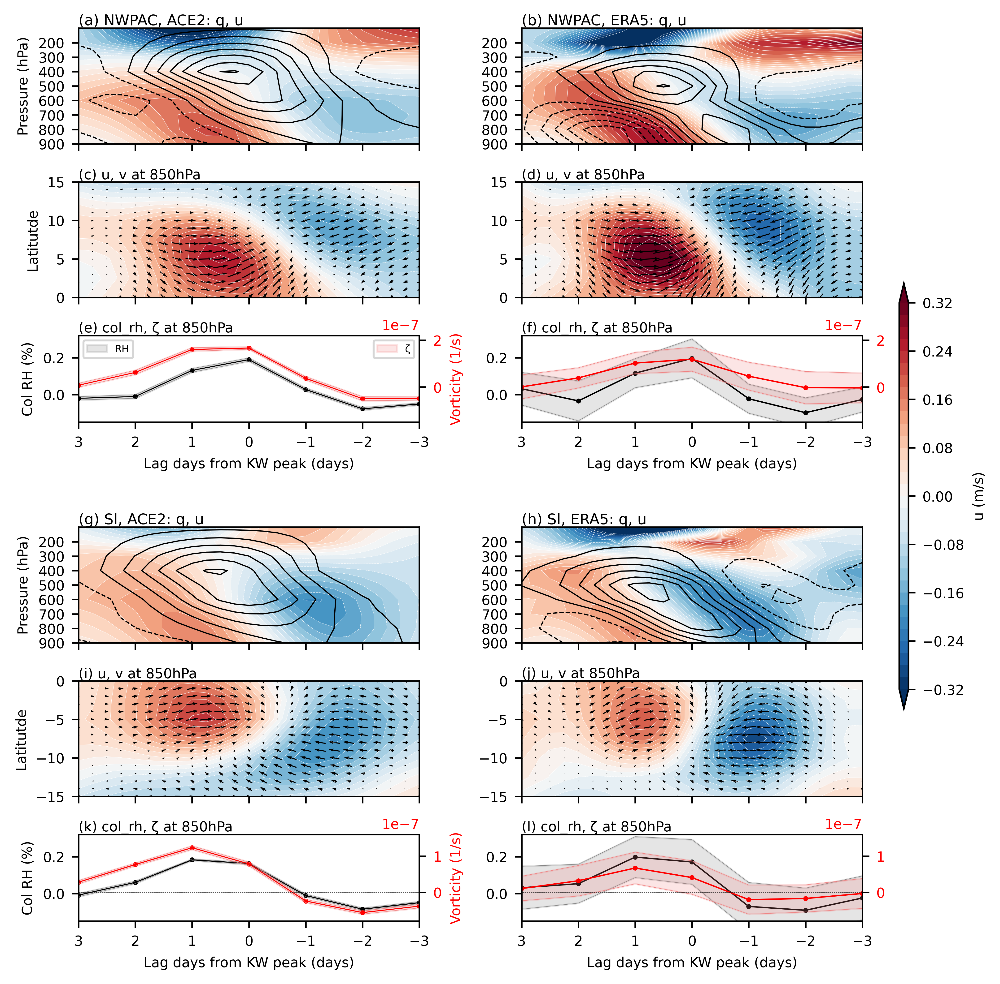

In [54]:
exp_list_title_new = list(['ACE2','ERA5'])
exp_list_new = list(['ace2','era5'])
#label_list_new = list(['(a) ','(b) ','(c) ','(d) ','(e) ','(f)', \
#                       '(g) ','(h) ','(l) ','(m) ','(n) ','(o) '])
#ibasin_list_new = np.array([1, 1, 1, 1, 1, 1,\
#                            4, 4, 4, 4, 4, 4])
label_list_new = list(['(a) ','(b) ','(c) ','(d) ','(e) ','(f) ','','', \
                       '(g) ','(h) ','(i) ','(j) ','(k) ','(l) '])
ibasin_list_new = np.array([1, 1, 1, 1, 1, 1,-1,-1,\
                            4, 4, 4, 4, 4, 4])

iv = 2
fig_name = 'Fig.3_KWcomposite_hor_vert_struct_TCGI_lag.png'

fig, axes = plt.subplots(6,2,figsize=(6.5, 10),dpi=600)
#gs = fig.add_gridspec(6, 2,width_ratios=[1,1],height_ratios=[2,2,1,2,2,1])
gs = fig.add_gridspec(7, 2,width_ratios=[1,1],height_ratios=[2,2,1.5,0.5,2,2,1.5])
font = 7
plt.rcParams.update({'font.size': font})
plt.subplots_adjust(left=0.1,right=0.95,top=0.88,bottom=0.25, wspace=0.3, hspace=0.4)
for iplt in range(0, 14):#12):
    irow = int(np.floor(iplt/2))
    iexp = int(np.mod(iplt,2))

    ####################################
    # 1. Vertical structre of q and u in NWPAC, 0:ace2, 1:era5
    #if iplt == 0 or iplt == 1 or iplt == 6 or iplt == 7:     
    if iplt == 0 or iplt == 1 or iplt == 8 or iplt == 9:  
        #plt.subplot(6, 2, iplt+1)
        ax2  = fig.add_subplot(gs[ irow, int(np.mod(iplt,2)) ])
        ax = plt.gca()

        V = globals()['u_lag_kw_basin_'+exp_list_new[iexp]]
        V2 = globals()['q_lag_kw_basin_'+exp_list_new[iexp]]

        clev = np.arange(-0.32,0.34,0.02)
        #
        clev_p = np.arange(0.5, 8.5, 1)*10**(-5)
        clev_n = np.arange(-8.5, 0.5, 1)*10**(-5)
        clev_0 = 0

        xx, yy = np.meshgrid(lags, plev)
        plt.contourf(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev, cmap=cmap_list[iv], extend='both' )
        
        plt.title(label_list_new[iplt]+basin_list[ibasin_list_new[iplt]]+', '+exp_list_title_new[iexp]+': q, u', pad=0.1, loc='left',fontsize=font+0.5)
        plt.yticks(np.arange(200,1000,100),fontsize=font)
        plt.gca().invert_yaxis()
        plt.xlim([-3, 3])
        plt.gca().invert_xaxis()
        #plt.xlabel('Lag days from KW peak')
        #if iplt == 0 or iplt == 6:
        if iplt == 0 or iplt == 8:
            plt.ylabel('Pressure (hPa)')

        plt.contour(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev, colors='w', linewidths=0.15)
        plt.contour(xx, yy, V2[:,:,ibasin_list_new[iplt]].T, levels=clev_p, colors='k', linewidths=0.6)
        plt.contour(xx, yy, V2[:,:,ibasin_list_new[iplt]].T, levels=clev_n, colors='k', linewidths=0.6, linestyles='dashed')

        ax.set_xticklabels([])  # Remove x-tick labels   

    ##################################
    # 2. Horizontal structure of u and v
    #if iplt == 2 or iplt == 3 or iplt == 8 or iplt == 9:
    if iplt == 2 or iplt == 3 or iplt == 10 or iplt == 11:
        ax3  = fig.add_subplot(gs[ irow, int(np.mod(iplt,2)) ])
        ax = plt.gca()
        V = globals()['u_lag_lat_kw_basin_'+exp_list_new[iexp]]
        V2 = globals()['v_lag_lat_kw_basin_'+exp_list_new[iexp]]
        #print(np.shape(V))

        if iv == 0:
            clev = np.arange(-8, 8.5, 0.5)*10**(-5)
        elif iv == 1:
            clev = np.arange(-0.06,0.065,0.005)
        elif iv == 2:
            clev = np.arange(-0.32,0.34,0.02)

        clev_p = np.arange(0.5, 8.5, 1)*10**(-5)
        clev_n = np.arange(-8.5, 0.5, 1)*10**(-5)
        clev_0 = 0

        if iplt == 2 or iplt == 3:
            xx, yy = np.meshgrid(lags, lat_NH)
        else:
            xx, yy = np.meshgrid(lags, lat_SH)

        cf = plt.contourf(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev, cmap=cmap_list[iv], extend='both' )
        
        plt.title(label_list_new[iplt]+'u, v at 850hPa', pad=0.1, loc='left',fontsize=font)
        plt.xlim([-3, 3])
        plt.gca().invert_xaxis()
        #plt.xlabel('Lag days from KW peak')
        if iexp == 0:
            plt.ylabel('Latitutde')
        
        plt.contour(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev,colors='w', linewidths=0.15)

        it = np.arange(0, np.size(lags), 2)

        # Original u and v
        u = V[:,:,ibasin_list_new[iplt]].T
        v = V2[:,:,ibasin_list_new[iplt]].T

        from scipy.interpolate import griddata
        # Create interpolation functions for U and V

        x_new = lags  # More points
        if iplt == 2 or iplt == 3:
            y_new = np.arange(0, 16, 1)
        else:
            y_new = np.arange(-15, 1, 1)
        X_new, Y_new = np.meshgrid(x_new, y_new)

        # Interpolate U and V onto the new grid

        U_new = griddata((xx.flatten(), yy.flatten()), u.flatten(), (X_new, Y_new), method='cubic')
        V_new = griddata((xx.flatten(), yy.flatten()), v.flatten(), (X_new, Y_new), method='cubic')

        plt.quiver(X_new[:,:], Y_new[:,:], U_new[:,:], V_new[:,:], pivot='middle', scale=6, width=0.003)
        
        ax.set_xticklabels([])  # Remove x-tick labels   

        #if iplt == 9:
        if iplt == 11:
            #cb = plt.colorbar(ax=axes[:,1],orientation = 'vertical',shrink=.6, aspect=40)#, pad=-0.01)
            cbar_ax = fig.add_axes([0.99, 0.4, 0.01, 0.3])  # [left, bottom, width, height]
            cb = fig.colorbar(cf, ax=axes[:, 1], cax=cbar_ax, orientation='vertical')
            cb.set_label(vname_list[iv]+' ('+unit_list[iv]+')', fontsize=font)

    ########################
    # 3. Line plot of lag
    #######################
    #if iplt == 4 or iplt ==5 or iplt == 10 or iplt == 11:
    if iplt == 4 or iplt ==5 or iplt == 12 or iplt == 13:
        ax4  = fig.add_subplot(gs[ irow, int(np.mod(iplt,2)) ])
        ax = plt.gca()

        ibasin_tmp = ibasin_list_new[iplt]
        KW_ace2_rh_ano = KW_composite_ace2_col_rh_daily[:,ibasin_tmp] - np.nanmean(KW_composite_ace2_col_rh_daily[:,ibasin_tmp])
        KW_era5_rh_ano = KW_composite_era5_col_rh_daily[:,ibasin_tmp] - np.nanmean(KW_composite_era5_col_rh_daily[:,ibasin_tmp]) 
        #
        KW_ace2_vor_ano = KW_composite_ace2_abs_vor_clip_daily[:,ibasin_tmp] - np.nanmean(KW_composite_ace2_abs_vor_clip_daily[:,ibasin_tmp])
        KW_era5_vor_ano = KW_composite_era5_abs_vor_clip_daily[:,ibasin_tmp] - np.nanmean(KW_composite_era5_abs_vor_clip_daily[:,ibasin_tmp])         
        

        ##############
        # Added
        kw_ace2_rh_std = KW_composite_ace2_col_rh_daily_std_ttest[:, ibasin_tmp]
        kw_era5_rh_std = KW_composite_era5_col_rh_daily_std_ttest[:, ibasin_tmp]
        kw_ace2_vor_std = KW_composite_ace2_abs_vor_clip_daily_std_ttest[:, ibasin_tmp]
        kw_era5_vor_std = KW_composite_era5_abs_vor_clip_daily_std_ttest[:, ibasin_tmp]
        ###############


        lags_tmp = lags_daily
        zero = np.zeros([np.size(lags_tmp)])
        #if iplt == 4 or iplt == 10:
        if iplt == 4 or iplt == 12:
            #ax.plot(lags_tmp, KW_ace2_rh_ano, 'k-o',markersize=3, linewidth=0.7)#2)
            ##########
            # Added std
            min = KW_ace2_rh_ano - kw_ace2_rh_std
            max = KW_ace2_rh_ano + kw_ace2_rh_std
            plt.fill_between(lags_tmp, min, max, color='grey', alpha=0.2)#0.4)
            ax.plot(lags_tmp, KW_ace2_rh_ano, 'k-o',markersize=1.5, linewidth=0.5)#2)
            #ax.errorbar(lags_tmp, KW_ace2_rh_ano, yerr=kw_ace2_rh_std, fmt='none', ecolor='grey', elinewidth=0.2, capsize=0)
            ax.plot(lags_tmp, min, 'grey', linewidth=0.2)#,markersize=2)
            ax.plot(lags_tmp, max, 'grey', linewidth=0.2)#,markersize=2)

            ############
            # create 2nd yaxis
            ax22 = ax.twinx()
            #ax22.plot(lags_tmp, KW_ace2_vor_ano, 'r-o',markersize=3, linewidth=0.7)#2)
            ##########
            # Added std
            min = KW_ace2_vor_ano - kw_ace2_vor_std
            max = KW_ace2_vor_ano + kw_ace2_vor_std
            ax22.fill_between(lags_tmp, min, max, color='lightcoral', alpha=0.2)#0.4)
            ax22.plot(lags_tmp, KW_ace2_vor_ano, 'r-o',markersize=1.5, linewidth=0.5)#2)
            #ax22.errorbar(lags_tmp, KW_ace2_vor_ano, yerr=kw_ace2_vor_std, fmt='none', ecolor='lightcoral', elinewidth=0.2, capsize=0)
            ax22.plot(lags_tmp, min, color='lightcoral', linewidth=0.2)#,markersize=2)
            ax22.plot(lags_tmp, max, color='lightcoral', linewidth=0.2)#,markersize=2)

        #elif iplt == 5 or iplt == 11:
        elif iplt == 5 or iplt == 13:
            #ax.plot(lags_tmp, KW_era5_rh_ano, 'k-o',markersize=3, linewidth=0.7)#2)
            ##########
            # Added std as shading
            min = KW_era5_rh_ano - kw_era5_rh_std
            max = KW_era5_rh_ano + kw_era5_rh_std
            plt.fill_between(lags_tmp, min, max, color='grey', alpha=0.2)#0.2)
            ax.plot(lags_tmp, KW_era5_rh_ano, 'k-o',markersize=1.5, linewidth=0.7)#2)
            #ax.errorbar(lags_tmp, KW_era5_rh_ano, yerr=kw_era5_rh_std, fmt='none', ecolor='grey', elinewidth=0.2, capsize=0)
            ax.plot(lags_tmp, min, 'grey', linewidth=0.2)#,markersize=2)
            ax.plot(lags_tmp, max, 'grey', linewidth=0.2)#,markersize=2)


            # create 2nd yaxis
            ax22 = ax.twinx()
            #ax22.plot(lags_tmp, KW_era5_vor_ano, 'r-o',markersize=3, linewidth=0.7)#2)
            ##########
            # Added std
            min = KW_era5_vor_ano - kw_era5_vor_std
            max = KW_era5_vor_ano + kw_era5_vor_std
            ax22.fill_between(lags_tmp, min, max, color='lightcoral', alpha=0.2)#0.2)
            ax22.plot(lags_tmp, KW_era5_vor_ano, 'r-o',markersize=1.5, linewidth=0.7)#2)
            #ax22.errorbar(lags_tmp, KW_era5_vor_ano, yerr=kw_era5_vor_std, fmt='none', ecolor='lightcoral', elinewidth=0.2, capsize=0)
            ax22.plot(lags_tmp, min, color='lightcoral', linewidth=0.2)#,markersize=2)
            ax22.plot(lags_tmp, max, color='lightcoral', linewidth=0.2)#,markersize=2)
        #           
        ax.tick_params(axis='y', labelcolor='k')
        ax22.tick_params(axis='y', labelcolor='r')
        if iplt == 4:
            ax.legend(['RH'],loc="upper left",fontsize=5)
        if iplt == 4:
            ax22.legend(['\u03B6'],loc="upper right",fontsize=5)

        plt.plot(lags_tmp,zero,'k--', linewidth=0.2) #linewidth=1)
        plt.xlim([-3, 3])
        plt.xticks(np.arange(-3,4), fontsize=4)
        plt.gca().invert_xaxis()
        ax.set_xlabel('Lag days from KW peak (days)')
        if iplt == 4 or iplt == 12:
            ax.set_ylabel('Col RH (%)')
            ax22.set_ylabel('Vorticity (1/s)', color='r')
        plt.title(label_list_new[iplt]+'col_rh, \u03B6 at 850hPa', pad=0.1, loc='left',fontsize=font)

        #ax.set_ylim([-0.1,0.23])
        ax.set_ylim([-0.15,0.32]) # added because of adding std
        if iplt == 4 or iplt == 5:
            #ax22.set_ylim([-1*10**(-7), 1.8*10**(-7)])
            ax22.set_ylim([-1.5*10**(-7), 2.2*10**(-7)])
        else:
            #ax22.set_ylim([-0.6*10**(-7), 1.4*10**(-7)])
            ax22.set_ylim([-0.8*10**(-7), 1.6*10**(-7)])


for ax in axes[0:,0]:
    ax.remove()
    
for ax in axes[0:,1]:
    ax.remove()
    

plt.savefig(fig_dir+fig_name,format='png', dpi=600)
plt.show()

# Plot new figure 3

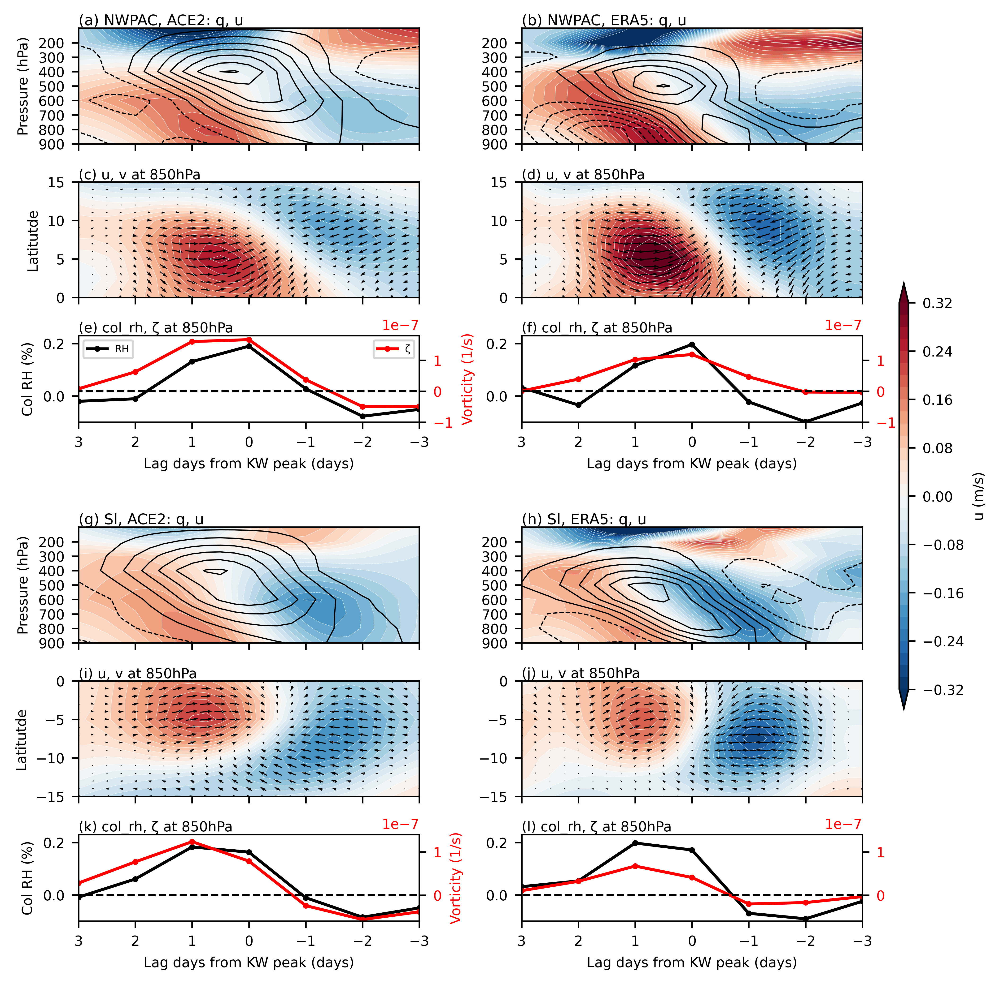

In [94]:
exp_list_title_new = list(['ACE2','ERA5'])
exp_list_new = list(['ace2','era5'])
#label_list_new = list(['(a) ','(b) ','(c) ','(d) ','(e) ','(f)', \
#                       '(g) ','(h) ','(l) ','(m) ','(n) ','(o) '])
#ibasin_list_new = np.array([1, 1, 1, 1, 1, 1,\
#                            4, 4, 4, 4, 4, 4])
label_list_new = list(['(a) ','(b) ','(c) ','(d) ','(e) ','(f) ','','', \
                       '(g) ','(h) ','(i) ','(j) ','(k) ','(l) '])
ibasin_list_new = np.array([1, 1, 1, 1, 1, 1,-1,-1,\
                            4, 4, 4, 4, 4, 4])

iv = 2
fig_name = 'Fig.3_KWcomposite_hor_vert_struct_TCGI_lag.png'

fig, axes = plt.subplots(6,2,figsize=(6.5, 10),dpi=600)
#gs = fig.add_gridspec(6, 2,width_ratios=[1,1],height_ratios=[2,2,1,2,2,1])
gs = fig.add_gridspec(7, 2,width_ratios=[1,1],height_ratios=[2,2,1.5,0.5,2,2,1.5])
font = 7
plt.rcParams.update({'font.size': font})
plt.subplots_adjust(left=0.1,right=0.95,top=0.88,bottom=0.25, wspace=0.3, hspace=0.4)
for iplt in range(0, 14):#12):
    irow = int(np.floor(iplt/2))
    iexp = int(np.mod(iplt,2))

    ####################################
    # 1. Vertical structre of q and u in NWPAC, 0:ace2, 1:era5
    #if iplt == 0 or iplt == 1 or iplt == 6 or iplt == 7:     
    if iplt == 0 or iplt == 1 or iplt == 8 or iplt == 9:  
        #plt.subplot(6, 2, iplt+1)
        ax2  = fig.add_subplot(gs[ irow, int(np.mod(iplt,2)) ])
        ax = plt.gca()

        V = globals()['u_lag_kw_basin_'+exp_list_new[iexp]]
        V2 = globals()['q_lag_kw_basin_'+exp_list_new[iexp]]

        clev = np.arange(-0.32,0.34,0.02)
        #
        clev_p = np.arange(0.5, 8.5, 1)*10**(-5)
        clev_n = np.arange(-8.5, 0.5, 1)*10**(-5)
        clev_0 = 0

        xx, yy = np.meshgrid(lags, plev)
        plt.contourf(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev, cmap=cmap_list[iv], extend='both' )
        
        plt.title(label_list_new[iplt]+basin_list[ibasin_list_new[iplt]]+', '+exp_list_title_new[iexp]+': q, u', pad=0.1, loc='left',fontsize=font+0.5)
        plt.yticks(np.arange(200,1000,100),fontsize=font)
        plt.gca().invert_yaxis()
        plt.xlim([-3, 3])
        plt.gca().invert_xaxis()
        #plt.xlabel('Lag days from KW peak')
        #if iplt == 0 or iplt == 6:
        if iplt == 0 or iplt == 8:
            plt.ylabel('Pressure (hPa)')

        plt.contour(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev, colors='w', linewidths=0.15)
        plt.contour(xx, yy, V2[:,:,ibasin_list_new[iplt]].T, levels=clev_p, colors='k', linewidths=0.6)
        plt.contour(xx, yy, V2[:,:,ibasin_list_new[iplt]].T, levels=clev_n, colors='k', linewidths=0.6, linestyles='dashed')

        ax.set_xticklabels([])  # Remove x-tick labels   

    ##################################
    # 2. Horizontal structure of u and v
    #if iplt == 2 or iplt == 3 or iplt == 8 or iplt == 9:
    if iplt == 2 or iplt == 3 or iplt == 10 or iplt == 11:
        ax3  = fig.add_subplot(gs[ irow, int(np.mod(iplt,2)) ])
        ax = plt.gca()
        V = globals()['u_lag_lat_kw_basin_'+exp_list_new[iexp]]
        V2 = globals()['v_lag_lat_kw_basin_'+exp_list_new[iexp]]
        #print(np.shape(V))

        if iv == 0:
            clev = np.arange(-8, 8.5, 0.5)*10**(-5)
        elif iv == 1:
            clev = np.arange(-0.06,0.065,0.005)
        elif iv == 2:
            clev = np.arange(-0.32,0.34,0.02)

        clev_p = np.arange(0.5, 8.5, 1)*10**(-5)
        clev_n = np.arange(-8.5, 0.5, 1)*10**(-5)
        clev_0 = 0

        if iplt == 2 or iplt == 3:
            xx, yy = np.meshgrid(lags, lat_NH)
        else:
            xx, yy = np.meshgrid(lags, lat_SH)

        cf = plt.contourf(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev, cmap=cmap_list[iv], extend='both' )
        
        plt.title(label_list_new[iplt]+'u, v at 850hPa', pad=0.1, loc='left',fontsize=font)
        plt.xlim([-3, 3])
        plt.gca().invert_xaxis()
        #plt.xlabel('Lag days from KW peak')
        if iexp == 0:
            plt.ylabel('Latitutde')
        
        plt.contour(xx, yy, V[:,:,ibasin_list_new[iplt]].T, levels=clev,colors='w', linewidths=0.15)

        it = np.arange(0, np.size(lags), 2)

        # Original u and v
        u = V[:,:,ibasin_list_new[iplt]].T
        v = V2[:,:,ibasin_list_new[iplt]].T

        from scipy.interpolate import griddata
        # Create interpolation functions for U and V

        x_new = lags  # More points
        if iplt == 2 or iplt == 3:
            y_new = np.arange(0, 16, 1)
        else:
            y_new = np.arange(-15, 1, 1)
        X_new, Y_new = np.meshgrid(x_new, y_new)

        # Interpolate U and V onto the new grid

        U_new = griddata((xx.flatten(), yy.flatten()), u.flatten(), (X_new, Y_new), method='cubic')
        V_new = griddata((xx.flatten(), yy.flatten()), v.flatten(), (X_new, Y_new), method='cubic')

        plt.quiver(X_new[:,:], Y_new[:,:], U_new[:,:], V_new[:,:], pivot='middle', scale=6, width=0.003)
        
        ax.set_xticklabels([])  # Remove x-tick labels   

        #if iplt == 9:
        if iplt == 11:
            #cb = plt.colorbar(ax=axes[:,1],orientation = 'vertical',shrink=.6, aspect=40)#, pad=-0.01)
            cbar_ax = fig.add_axes([0.99, 0.4, 0.01, 0.3])  # [left, bottom, width, height]
            cb = fig.colorbar(cf, ax=axes[:, 1], cax=cbar_ax, orientation='vertical')
            cb.set_label(vname_list[iv]+' ('+unit_list[iv]+')', fontsize=font)

    ########################
    # 3. Line plot of lag
    #######################
    #if iplt == 4 or iplt ==5 or iplt == 10 or iplt == 11:
    if iplt == 4 or iplt ==5 or iplt == 12 or iplt == 13:
        ax4  = fig.add_subplot(gs[ irow, int(np.mod(iplt,2)) ])
        ax = plt.gca()

        ibasin_tmp = ibasin_list_new[iplt]
        KW_ace2_rh_ano = KW_composite_ace2_col_rh_daily[:,ibasin_tmp] - np.nanmean(KW_composite_ace2_col_rh_daily[:,ibasin_tmp])
        KW_era5_rh_ano = KW_composite_era5_col_rh_daily[:,ibasin_tmp] - np.nanmean(KW_composite_era5_col_rh_daily[:,ibasin_tmp]) 
        #
        KW_ace2_vor_ano = KW_composite_ace2_abs_vor_clip_daily[:,ibasin_tmp] - np.nanmean(KW_composite_ace2_abs_vor_clip_daily[:,ibasin_tmp])
        KW_era5_vor_ano = KW_composite_era5_abs_vor_clip_daily[:,ibasin_tmp] - np.nanmean(KW_composite_era5_abs_vor_clip_daily[:,ibasin_tmp])         
        
        lags_tmp = lags_daily
        zero = np.zeros([np.size(lags_tmp)])
        #if iplt == 4 or iplt == 10:
        if iplt == 4 or iplt == 12:
            ax.plot(lags_tmp, KW_ace2_rh_ano, 'k-o',markersize=2)
            # create 2nd yaxis
            ax22 = ax.twinx()
            ax22.plot(lags_tmp, KW_ace2_vor_ano, 'r-o',markersize=2)
        #elif iplt == 5 or iplt == 11:
        elif iplt == 5 or iplt == 13:
            ax.plot(lags_tmp, KW_era5_rh_ano, 'k-o',markersize=2)
            # create 2nd yaxis
            ax22 = ax.twinx()
            ax22.plot(lags_tmp, KW_era5_vor_ano, 'r-o',markersize=2)
        #           
        ax.tick_params(axis='y', labelcolor='k')
        ax22.tick_params(axis='y', labelcolor='r')
        if iplt == 4:
            ax.legend(['RH'],loc="upper left",fontsize=5)
        if iplt == 4:
            ax22.legend(['\u03B6'],loc="upper right",fontsize=5)

        plt.plot(lags_tmp,zero,'k--', linewidth=1)
        plt.xlim([-3, 3])
        plt.xticks(np.arange(-3,4), fontsize=4)
        plt.gca().invert_xaxis()
        ax.set_xlabel('Lag days from KW peak (days)')
        if iplt == 4 or iplt == 12:
            ax.set_ylabel('Col RH (%)')
            ax22.set_ylabel('Vorticity (1/s)', color='r')
        plt.title(label_list_new[iplt]+'col_rh, \u03B6 at 850hPa', pad=0.1, loc='left',fontsize=font)

        ax.set_ylim([-0.1,0.23])
        if iplt == 4 or iplt == 5:
            ax22.set_ylim([-1*10**(-7), 1.8*10**(-7)])
        else:
            ax22.set_ylim([-0.6*10**(-7), 1.4*10**(-7)])


for ax in axes[0:,0]:
    ax.remove()
    
for ax in axes[0:,1]:
    ax.remove()
    

plt.savefig(fig_dir+fig_name,format='png', dpi=600)
plt.show()

# Plot each TCGI factor for each basin

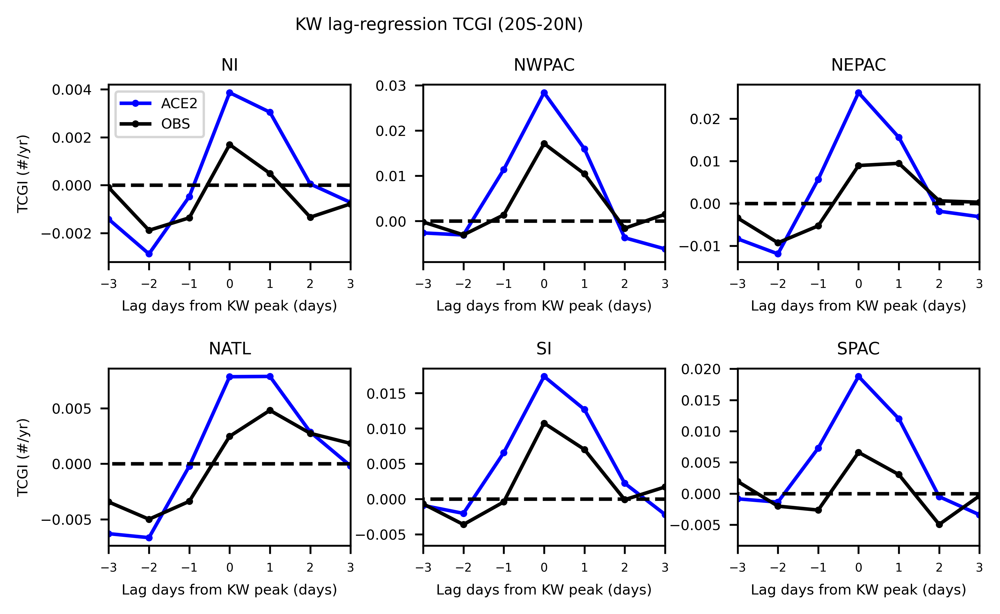

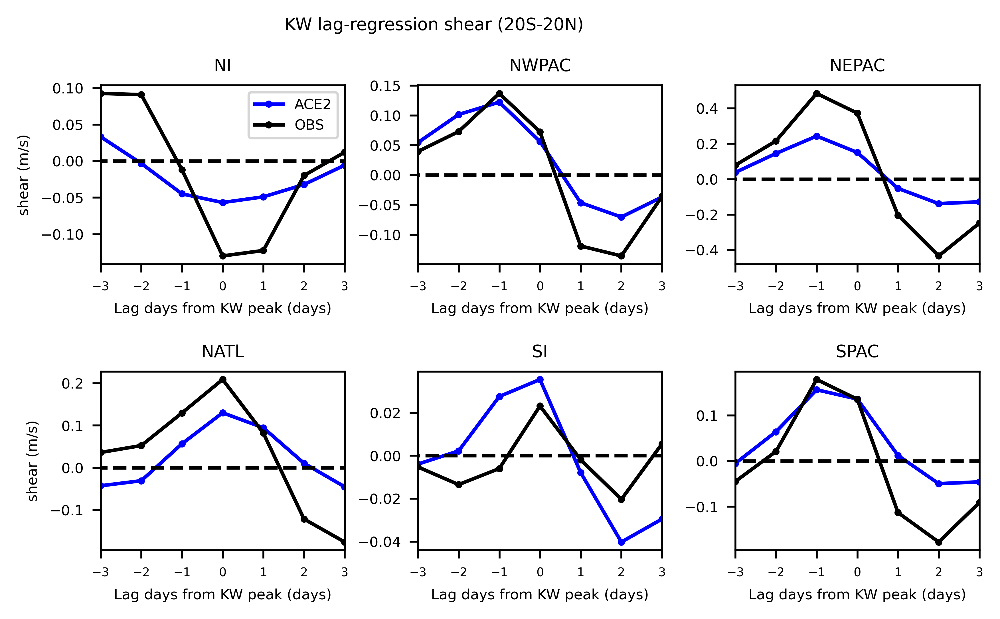

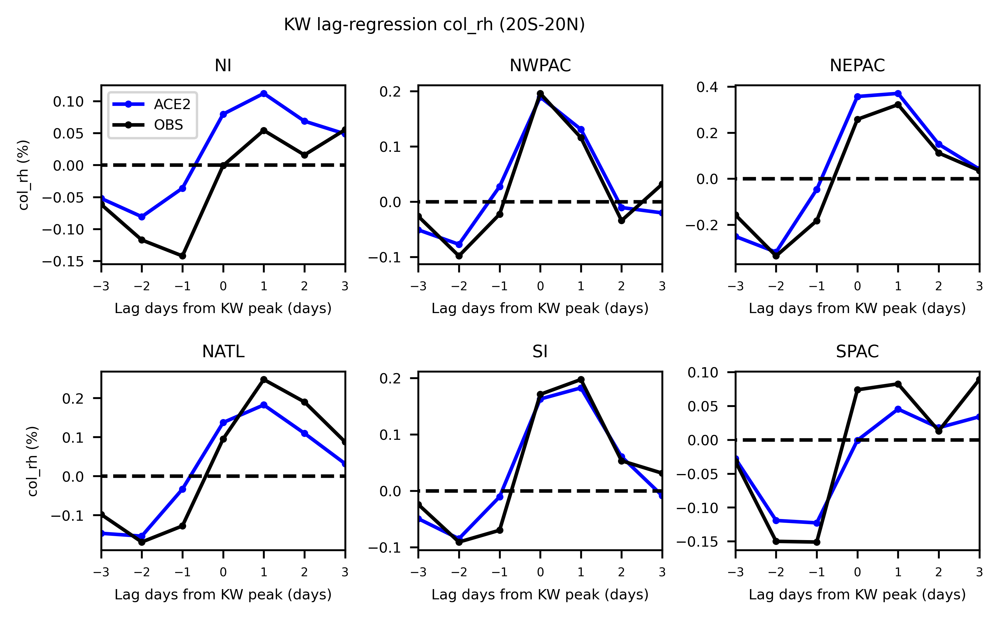

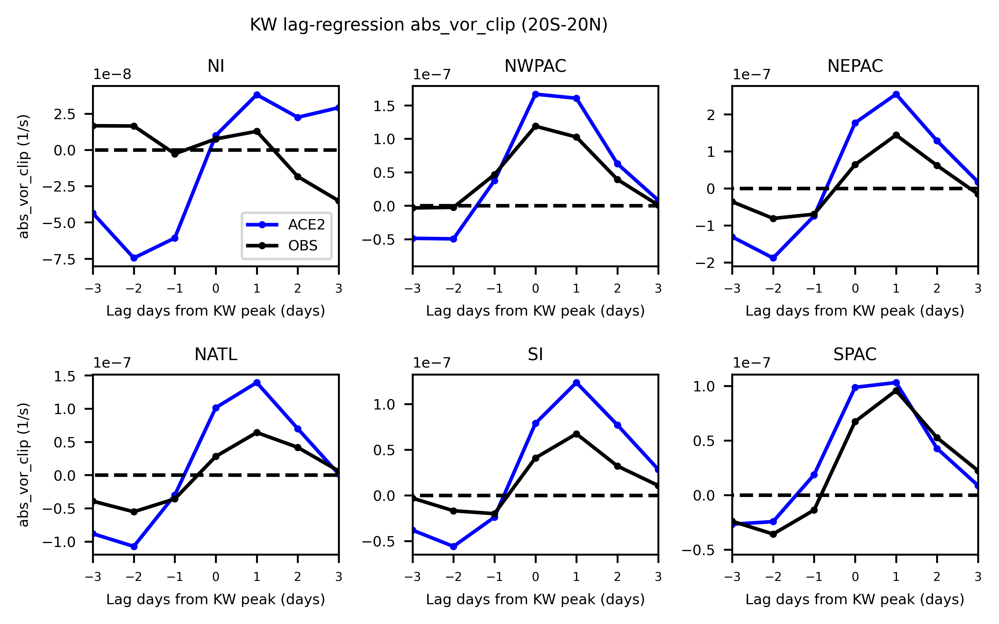

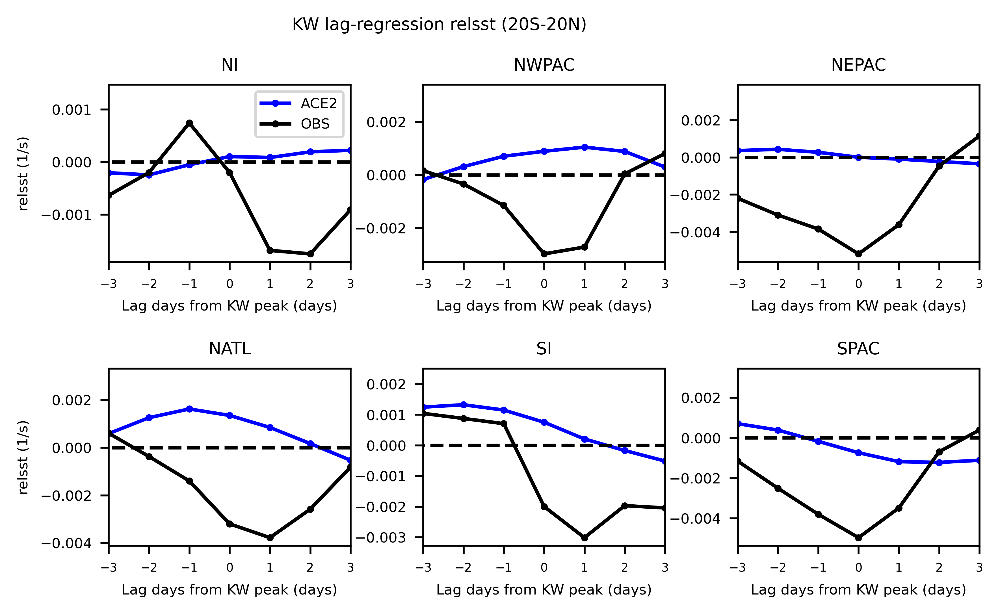

In [125]:
# Plot lag regression 
vname_list = list(['TCGI','shear','col_rh','abs_vor_clip','relsst'])

for iv in range(0, np.size(vname_list)):

    KW_composite_ace2 = globals()['KW_composite_ace2_'+vname_list[iv]+'_daily']
    KW_composite_era5 = globals()['KW_composite_era5_'+vname_list[iv]+'_daily']

    lags_tmp = lags_daily

    fig_name = 'Fig.S3-6.KW_lag_regression_'+vname_list[iv]+'_2p5deg_basin_summer_only.png'
    fig = plt.subplots(2,3,figsize=(6.5, 4),dpi=600)
    plt.subplots_adjust(left=0.2,right=0.99,top=0.88,bottom=0.2, wspace=0.3, hspace=0.6)
    plt.rcParams.update({'font.size': 6})
    for ibasin in range(0, nbasin):
        plt.subplot(2, 3, ibasin+1)
        KW_composite_ace2_ano = KW_composite_ace2[:,ibasin] - np.nanmean(KW_composite_ace2[:,ibasin])
        KW_composite_era5_ano = KW_composite_era5[:,ibasin] - np.nanmean(KW_composite_era5[:,ibasin]) 
        zero = np.zeros([np.size(lags_tmp)])
        plt.plot(lags_tmp, KW_composite_ace2_ano, 'b-o',markersize=2)
        plt.plot(lags_tmp, KW_composite_era5_ano, 'k-o',markersize=2)
        if ibasin == 0:
            plt.legend(['ACE2','OBS'])
        plt.plot(lags_tmp,zero,'k--')
        plt.xlim([-3, 3])
        plt.xticks(np.arange(-3,4), fontsize=5)
        plt.xlabel('Lag days from KW peak (days)')
        if ibasin == 0 or ibasin == 3:
            plt.ylabel(vname_list[iv]+' ('+unit_list[iv]+')')
        plt.title(basin_list[ibasin])
        if ibasin == 1:
            plt.suptitle('KW lag-regression '+vname_list[iv]+' (20S-20N)')
        
    plt.savefig(fig_dir_supplement+fig_name,format='png', dpi=600)
    plt.show()
    plt.close()